In [3]:
'''
!git clone https://github.com/openai/gym.git
%cd gym
!pip install -e .
%cd ..
'''

# instalar rSim
!apt-get update
!apt-get install qt5-default libode-dev
!cd build
!git clone https://github.com/robocin/rSim.git
%cd rSim
!mkdir buildc
%cd buildc
!ls
!cmake ..
!make -j4
%cd ..
!pip install -e .
%cd ..

# instalar rSoccer
!git clone https://github.com/robocin/rSoccer.git
%cd rSoccer
!pip install -e ./
%cd ..

# instalar a lib ptan
!pip install ptan

# libs de visualização
!pip install gym pyvirtualdisplay > /dev/null 2>&1
!apt-get install -y xvfb python-opengl ffmpeg > /dev/null 2>&1

# libs visualização em ML
# https://colab.research.google.com/github/wandb/examples/blob/master/colabs/pytorch/Simple_PyTorch_Integration.ipynb#scrollTo=qKitRLZsYzCP
#!pip install wandb
#!wandb login

Ign:1 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  InRelease
Ign:2 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  InRelease
Get:3 https://cloud.r-project.org/bin/linux/ubuntu bionic-cran40/ InRelease [3,626 B]
Get:4 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  Release [697 B]
Hit:5 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  Release
Get:6 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  Release.gpg [836 B]
Get:7 http://security.ubuntu.com/ubuntu bionic-security InRelease [88.7 kB]
Hit:8 http://archive.ubuntu.com/ubuntu bionic InRelease
Get:9 http://ppa.launchpad.net/c2d4u.team/c2d4u4.0+/ubuntu bionic InRelease [15.9 kB]
Get:10 https://cloud.r-project.org/bin/linux/ubuntu bionic-cran40/ Packages [62.9 kB]
Get:11 http://archive.ubuntu.com/ubuntu bionic-updates InRelease [88.7 kB]
Ign:13 https://developer.download.nvi

# **Agente** (Rede neural)

*   Output da rede Actor -> Vetor N-dimensional onde cada elemento está contido em [-1,1] 
*   Output da rede Critic -> Q(s,a)



In [2]:
from torch import nn
import ptan

# O actor não computa mais um output aleatório, mas sim deterministico
# Como range das ações é [-1,1], utiliza-se uma Tanh para restringir
# o output para cada ação neste range.
class DDPGActor(nn.Module):
  def __init__(self, obs_size, act_size):
    super(DDPGActor, self).__init__()
    self.net = nn.Sequential(
      nn.Linear(obs_size, 400),
      nn.ReLU(),
      nn.Linear(400, 300),
      nn.ReLU(),
      nn.Linear(300, act_size),
      nn.Tanh()
      )

  def forward(self, x):
    return self.net(x)

# O crítico estima Q(s,a) - não é mais utilizado como baseline 
class DDPGCritic(nn.Module):
  def __init__(self, obs_size, act_size):
    super(DDPGCritic, self).__init__()
    self.obs_net = nn.Sequential(
      nn.Linear(obs_size, 400),
      nn.ReLU(),
      )
    self.out_net = nn.Sequential(
      nn.Linear(400 + act_size, 300),
      nn.ReLU(),
      nn.Linear(300, 1)
      )
  def forward(self, x, a):
    obs = self.obs_net(x)
    # concatenar observações processadas e ações, para estimar Q(s,a)
    return self.out_net(torch.cat([obs, a], dim=1))


In [3]:
class AgentDDPG(ptan.agent.BaseAgent):
  """
  Agent implementing Orstein-Uhlenbeck exploration process
  """
  def __init__(self, net, device="cpu", ou_enabled=True,
                ou_mu=0.0, ou_teta=0.15, ou_sigma=0.2,
                ou_epsilon=1.0):
    self.net = net
    self.device = device
    self.ou_enabled = ou_enabled
    self.ou_mu = ou_mu
    self.ou_teta = ou_teta
    self.ou_sigma = ou_sigma
    self.ou_epsilon = ou_epsilon
  
  def initial_state(self):
    return None

  # converter observações em ações
  def __call__(self, states, agent_states):
    states_v = ptan.agent.float32_preprocessor(states)
    states_v = states_v.to(self.device)
    mu_v = self.net(states_v)
    actions = mu_v.data.cpu().numpy()

    # processo OU para adicionar exploração  
    if self.ou_enabled and self.ou_epsilon > 0:
      new_a_states = []
      for a_state, action in zip(agent_states, actions):
        if a_state is None:
          a_state = np.zeros(shape=action.shape, dtype=np.float32)
        a_state += self.ou_teta * (self.ou_mu - a_state)
        a_state += self.ou_sigma * np.random.normal(size=action.shape)
        action += self.ou_epsilon * a_state
        new_a_states.append(a_state)
    else:
      new_a_states = agent_states
    
    actions = np.clip(actions, -1, 1)
    return actions, agent_states

In [4]:
import math

def test_net(net, env, count=10, device="cpu"):
  rewards = 0.0
  steps = 0
  for _ in range(count):
    obs = env.reset()
    while True:
      obs_v = ptan.agent.float32_preprocessor([obs])
      obs_v = obs_v.to(device)
      mu_v = net(obs_v)
      action = mu_v.squeeze(dim=0).data.cpu().numpy()
      action = np.clip(action, -1, 1)
      obs, reward, done, _ = env.step(action)
      for key in reward.keys(): # adapted for MA
        rewards += reward[key]
      steps += 1
      if done:
        break
  return rewards / count, steps / count


# **Parâmetros de treinamento**

In [5]:
import time
import numpy as np
import collections
import torch
import torch.nn as nn
import torch.optim as optim

DEFAULT_ENV_NAME = "SSLPassEnduranceMA-v0"

GAMMA = 0.99
BATCH_SIZE = 64
LEARNING_RATE = 1e-4
REPLAY_SIZE = 100000
REPLAY_INITIAL = 10000
CUDA = True

TEST_ITERS = 1000

#Conversão de dados de treino em tensores

In [6]:
def unpack_batch_ddqn(batch, device="cpu"):
    states, actions, rewards, dones, last_states = [], [], [], [], []
    for exp in batch:
        states.append(exp.state)
        actions.append(exp.action)
        rewards.append(exp.reward)
        dones.append(exp.last_state is None)
        if exp.last_state is None:
            last_states.append(exp.state)
        else:
            last_states.append(exp.last_state)
    states_v = ptan.agent.float32_preprocessor(states).to(device)
    actions_v = ptan.agent.float32_preprocessor(actions).to(device)
    rewards_v = ptan.agent.float32_preprocessor(rewards).to(device)
    last_states_v = ptan.agent.float32_preprocessor(last_states).to(device)
    dones_t = torch.BoolTensor(dones).to(device)
    return states_v, actions_v, rewards_v, dones_t, last_states_v

# Buffer para MA

In [7]:
import collections
from collections import namedtuple, deque

# one single experience step
Experience = namedtuple('Experience', ['state', 'action', 'reward', 'done'])

def _group_list(items, lens):
    """
    Unflat the list of items by lens
    :param items: list of items
    :param lens: list of integers
    :return: list of list of items grouped by lengths
    """
    res = []
    cur_ofs = 0
    for g_len in lens:
        res.append(items[cur_ofs:cur_ofs+g_len])
        cur_ofs += g_len
    return res

class ExperienceSourceMA(ptan.experience.ExperienceSource):
    def __iter__(self):
        states, agent_states, histories, cur_rewards, cur_steps = [], [], [], [], []
        env_lens = []
        for env in self.pool:
            obs = env.reset()
            # if the environment is vectorized, all it's output is lists of results.
            # Details are here: https://github.com/openai/universe/blob/master/doc/env_semantics.rst
            if self.vectorized:
                obs_len = len(obs)
                states.extend(obs)
            else:
                obs_len = len(obs)
                states.extend(obs)
            env_lens.append(obs_len)

            for _ in range(obs_len):
                histories.append(deque(maxlen=self.steps_count))
                cur_rewards.append(0.0)
                cur_steps.append(0)
                agent_states.append(self.agent.initial_state())

        iter_idx = 0
        while True:
            actions = [None] * len(states)
            states_input = []
            states_indices = []
            for idx, state in enumerate(states):
                if state is None:
                    actions[idx] = self.pool[0].action_space.sample()  # assume that all envs are from the same family
                else:
                    states_input.append(state)
                    states_indices.append(idx)
            if states_input:
                #print(states_input)
                states_actions, new_agent_states = self.agent(states_input, agent_states)
                for idx, action in enumerate(states_actions):
                    g_idx = states_indices[idx]
                    actions[g_idx] = action
                    agent_states[g_idx] = new_agent_states[idx]
            grouped_actions = _group_list(actions, env_lens)
            
            global_ofs = 0
            for env_idx, (env, action_n) in enumerate(zip(self.pool, grouped_actions)):
                #print("action_current: " + str(action_n))
                if self.vectorized:
                    next_state_n, r_n, is_done_n, _ = env.step(action_n)
                else:
                    next_state, r, is_done, _ = env.step(action_n)
                    next_state_n, r_n, is_done_n = next_state, [r[key] for key in r.keys()], [is_done]*len(next_state)
                count_done = 0
                for ofs, (action, next_state, r, is_done) in enumerate(zip(action_n, next_state_n, r_n, is_done_n)):
                    idx = global_ofs + ofs
                    state = states[idx]
                    history = histories[idx]
                    cur_rewards[idx] += r
                    cur_steps[idx] += 1
                    if state is not None:
                        history.append(Experience(state=state, action=action, reward=r, done=is_done))
                    if len(history) == self.steps_count and iter_idx % self.steps_delta == 0:
                        yield tuple(history)
                    states[idx] = next_state
                    if is_done and count_done + 1 == len(r_n):
                        #print("here")
                        # in case of very short episode (shorter than our steps count), send gathered history
                        if 0 < len(history) < self.steps_count:
                            yield tuple(history)
                        # generate tail of history
                        while len(history) > 1:
                            history.popleft()
                            yield tuple(history)
                        self.total_rewards.append(cur_rewards[idx])
                        self.total_steps.append(cur_steps[idx])
                        cur_rewards[idx] = 0.0
                        cur_steps[idx] = 0
                        # vectorized envs are reset automatically
                        states[idx] = env.reset() if not self.vectorized else None
                        agent_states[idx] = self.agent.initial_state()
                        history.clear()
                global_ofs += len(action_n)
            iter_idx += 1

ExperienceFirstLast = collections.namedtuple('ExperienceFirstLast', ('state', 'action', 'reward', 'last_state'))
class ExperienceSourceFirstLastMA(ExperienceSourceMA):
    """
    This is a wrapper around ExperienceSource to prevent storing full trajectory in replay buffer when we need
    only first and last states. For every trajectory piece it calculates discounted reward and emits only first
    and last states and action taken in the first state.
    If we have partial trajectory at the end of episode, last_state will be None
    """
    def __init__(self, env, agent, gamma, steps_count=1, steps_delta=1, vectorized=False):
        assert isinstance(gamma, float)
        super(ExperienceSourceFirstLastMA, self).__init__(env, agent, steps_count+1, steps_delta, vectorized=vectorized)
        self.gamma = gamma
        self.steps = steps_count

    def __iter__(self):
        for exp in super(ExperienceSourceFirstLastMA, self).__iter__():
            #print(exp)
            if exp[-1].done and len(exp) <= self.steps:
                last_state = None
                elems = exp
            else:
                last_state = exp[-1].state
                elems = exp[:-1]
            total_reward = 0.0
            for e in reversed(elems):
                total_reward *= self.gamma
                total_reward += e.reward
            yield ExperienceFirstLast(state=exp[0].state, action=exp[0].action,
                                      reward=total_reward, last_state=last_state)

class MAReplayBuffer(ptan.experience.ExperienceReplayBuffer):
    def _add(self, sample):
        if len(self.buffer) < self.capacity:
            self.buffer.append(sample)
        else:
            self.buffer[self.pos] = sample
        self.pos = (self.pos + 1) % self.capacity

    def populate(self, samples):
        """
        Populates samples into the buffer
        :param samples: how many samples to populate
        """
        for _ in range(samples):
            entry = next(self.experience_source_iter)
            self._add(entry)


# Loop principal

O DDPG é off-policy, portanto faz uso de replay buffers

In [8]:
import gym 
import rsoccer_gym
import ptan
import torch.nn.functional as F


#import wandb

# 1. Start a new run
#wandb.init(project='gpt-3', entity='jcssilva')

# 2. Save model inputs and hyperparameters
#config = wandb.config
#config.learning_rate = 0.01

env = gym.make(DEFAULT_ENV_NAME)
test_env = gym.make(DEFAULT_ENV_NAME)
device = torch.device("cuda" if CUDA else "cpu")

act_net = DDPGActor(env.observation_space.shape[1],
        env.action_space.shape[1]).to(device)
crt_net = DDPGCritic(env.observation_space.shape[1],
        env.action_space.shape[1]).to(device)
#print(env.observation_space.shape[1])
#print(crt_net)
tgt_act_net = ptan.agent.TargetNet(act_net)
tgt_crt_net = ptan.agent.TargetNet(crt_net)

agent = AgentDDPG(act_net, device=device)
exp_source = ExperienceSourceFirstLastMA(
        env, agent, gamma=GAMMA, steps_count=1)
buffer =  MAReplayBuffer(
        exp_source, buffer_size=REPLAY_SIZE)

act_opt = optim.Adam(act_net.parameters(), lr=LEARNING_RATE)
crt_opt = optim.Adam(crt_net.parameters(), lr=LEARNING_RATE)

frame_idx = 0
best_reward = None
rewards_ = [] 
steps_ = []
# Log gradients and model parameters
#wandb.watch(act_net)
while True:  
  frame_idx += 1
  buffer.populate(1)
  rewards_steps = exp_source.pop_rewards_steps()
  if rewards_steps:
      rewards, steps = zip(*rewards_steps)

  if len(buffer) < REPLAY_INITIAL:
    continue

  # unpack experience batch
  batch = buffer.sample(BATCH_SIZE)
  states_v, actions_v, rewards_v, \
          dones_mask, last_states_v = unpack_batch_ddqn(batch, device)

  # train critic
  crt_opt.zero_grad()
  q_v = crt_net(states_v, actions_v)
  last_act_v = tgt_act_net.target_model(last_states_v)
  q_last_v = tgt_crt_net.target_model(last_states_v, last_act_v)
  q_last_v[dones_mask] = 0.0
  q_ref_v = rewards_v.unsqueeze(dim=-1) + q_last_v * GAMMA
  critic_loss_v = F.mse_loss(q_v, q_ref_v.detach())
  critic_loss_v.backward()
  crt_opt.step()

  # train actor
  act_opt.zero_grad()
  cur_actions_v = act_net(states_v)
  actor_loss_v = -crt_net(states_v, cur_actions_v)
  actor_loss_v = actor_loss_v.mean()
  actor_loss_v.backward()
  act_opt.step()

  tgt_act_net.alpha_sync(alpha=1 - 1e-3)
  tgt_crt_net.alpha_sync(alpha=1 - 1e-3)

  if frame_idx % TEST_ITERS == 0:
      ts = time.time()
      rewards, steps = test_net(act_net, test_env, device=device)
      rewards_.append(rewards)
      steps_.append(frame_idx)
      print("Test done is %.2f sec, reward %.3f, steps %d, total_steps %d" % (
          time.time() - ts, rewards, steps, frame_idx))
      if best_reward is None or best_reward < rewards:
          if best_reward is not None:
              print("Best reward updated: %.3f -> %.3f" % (best_reward, rewards))
              name = DEFAULT_ENV_NAME + "-DDPG.dat"
              torch.save(act_net.state_dict(), name)
          best_reward = rewards

      # Log metrics to visualize performance
      #wandb.log({"mean_reward_test": rewards})
      #wandb.log({"actor_loss": actor_loss_v})

  if frame_idx >= 2e6:
    break


Environment initialized
Environment initialized
Test done is 0.48 sec, reward -2.064, steps 21, total_steps 10000
Test done is 0.50 sec, reward -1.387, steps 24, total_steps 11000
Best reward updated: -2.064 -> -1.387
Test done is 0.55 sec, reward -1.664, steps 26, total_steps 12000
Test done is 0.51 sec, reward -1.599, steps 24, total_steps 13000
Test done is 0.59 sec, reward -1.092, steps 25, total_steps 14000
Best reward updated: -1.387 -> -1.092
Test done is 0.55 sec, reward -1.204, steps 24, total_steps 15000
Test done is 0.59 sec, reward -1.117, steps 25, total_steps 16000
Test done is 0.63 sec, reward -0.615, steps 29, total_steps 17000
Best reward updated: -1.092 -> -0.615
Test done is 0.59 sec, reward -0.844, steps 27, total_steps 18000
Test done is 0.57 sec, reward -0.613, steps 28, total_steps 19000
Best reward updated: -0.615 -> -0.613
Test done is 0.57 sec, reward -0.568, steps 27, total_steps 20000
Best reward updated: -0.613 -> -0.568
Test done is 0.61 sec, reward -1.065

KeyboardInterrupt: ignored

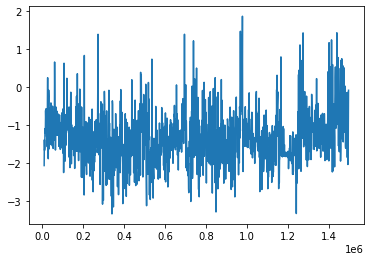

In [9]:
import matplotlib.pyplot as plt

plt.figure()
plt.plot(steps_,rewards_)   

# Agente treinado em ação

In [10]:
def show_gif(fname):
    import base64
    from IPython import display
    with open(fname, 'rb') as fd:
        b64 = base64.b64encode(fd.read()).decode('ascii')
    return display.HTML(f'<img src="data:image/gif;base64,{b64}" />')

Environment initialized



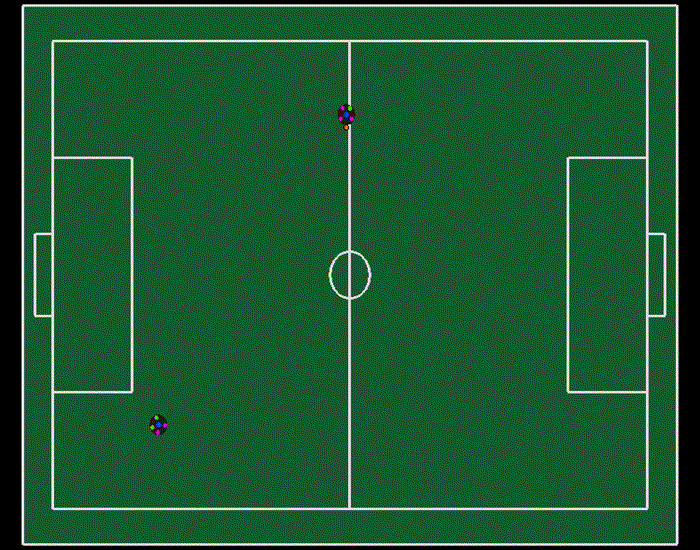

In [18]:
import gym
import ptan

from PIL import Image
import matplotlib.pyplot as plt
from IPython import display as ipythondisplay

from pyvirtualdisplay import Display
display = Display(visible=0, size=(200, 150))
display.start()

# ambiente
env = gym.make(DEFAULT_ENV_NAME)

# agente
net = DDPGActor(env.observation_space.shape[1],env.action_space.shape[1]).to(device)
net.load_state_dict(torch.load(DEFAULT_ENV_NAME + "-DDPG.dat"))
net.eval()
agent = AgentDDPG(net, device=device)

# start simulation
for i in range(1):
  done = False
  frames = []
  observation = env.reset()
  while not done:
    obs_v = torch.FloatTensor([observation])
    action, _ = agent(obs_v, [])
    observation, reward, done, info = env.step(action[0]) 
    screen = Image.fromarray(env.render(mode='rgb_array'))
    screen = screen.resize(size=(700, 550))
    frames.append(screen) 

env.close()

frames[0].save('episode.gif', format='GIF',
               append_images=frames[1:], save_all=True, loop = 100, duration =0.0001)

show_gif('episode.gif')

Agente com politica aleatória

Environment initialized



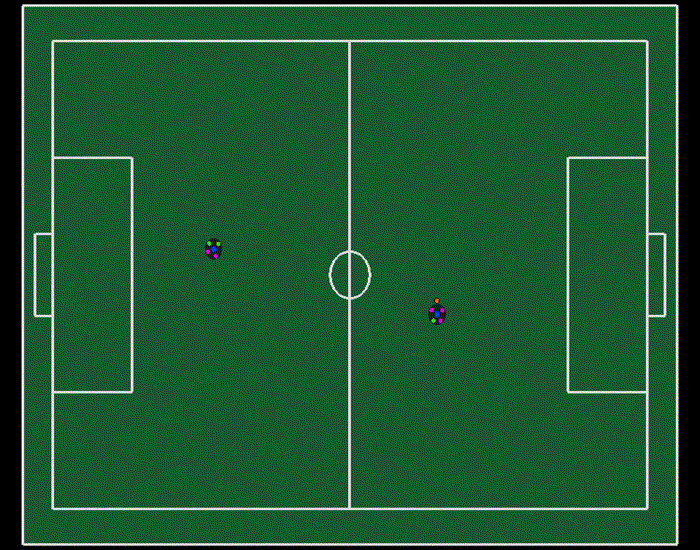

In [19]:
import gym 
import rsoccer_gym

from PIL import Image
import matplotlib.pyplot as plt
from IPython import display as ipythondisplay

from pyvirtualdisplay import Display
display = Display(visible=0, size=(200, 150))
display.start()

#env = gym.make("SSLPassEnduranceMA-v0")
env = gym.make("SSLPassEndurance-v0")
observation = env.reset()
for i in range(1):
  done = False
  frames = []
  while not done:
    #env.render()
    action = env.action_space.sample()
    #print(action)
    observation, reward, done, info = env.step(action)   
    #print(observation)
    screen = Image.fromarray(env.render(mode='rgb_array'))
    screen = screen.resize(size=(700, 550))
    frames.append(screen)   
    #if done:
    #    observation = env.reset() 

env.close()
frames[0].save('episode.gif', format='GIF',
               append_images=frames[1:], save_all=True, loop = 100, duration =0.0001)

show_gif('episode.gif')